# Recovering surfaces with Dleto

CC-BY Brooksbank, Kassabov, Wilson

This notebook demonstrates how to use Dleto to detect when tensor data clusters near a hidden embedded surface. The demonstration uses an embedded sphere for this purpose, but it will be clear how to replace it with a different surface.

## 0. Enable Julia for Notebooks

First you should check that you have `Julia` and `IJulia` installed and that you can load the Dleto project. Installation instructions are available at [Installing Dleto](https://github.com/thetensor-space/OpenDleto/tree/main/docs/Installing-Delto.md).


## 1. Installing Dleto

To load `OpenDleto` run the next cell.  This assumes that you have cloned the full [Git Repository](https://github.com/thetensor-space/OpenDleto) and that you have launched this notebook from the subfolder `./labs/SphereLab/`

In [1]:
using Pkg
# To install from remote repository, use:
# Pkg.add(url="https://github.com/thetensor-space/OpenDleto")
Pkg.activate( "../" ) 

  Activating project at `~/CODE/OpenDleto`


Now we can start using Dleto.

Optional but recommended once per fresh kernel: run `Dleto.warmup()` after imports to precompile common tensor workflows.

In [2]:
using Plots, LinearAlgebra
using Dleto
using Dleto.TensorSpace: ts, randSurfaceTensor, inds

Dleto.warmup(verbose=false)


Loading Dleto KrylovKit Extension


WebIO._IJuliaInit()

Loading Dleto Plots Extension
Loading Dleto IterativeSolvers Extension
Using SVDSolver...
Converting LinearMap to Matrix for SVD...


[ Info: der: nullity 2 certified (rule :gap), cut at the Float64 precision floor 1.7763568394002505e-15 (relative) -- a near-derivation hidden below that floor would look identical. Values around the cut: [7.943275490985239e-17, 3.276424841300097e-16] | [1.6535796308629406e-6, 2.906432332364782e-6, 5.043815244124112e-6]
[ Info: Found 2 derivations for stratification.


(dims = (6, 5, 4), tol = 1.0e-6, eltype = Float64, stratify = true, nondeg = true)

## 2. Embedding a sphere in a tensor

The following builds an array whose nonzero values congregate close to the surface of a sphere:  


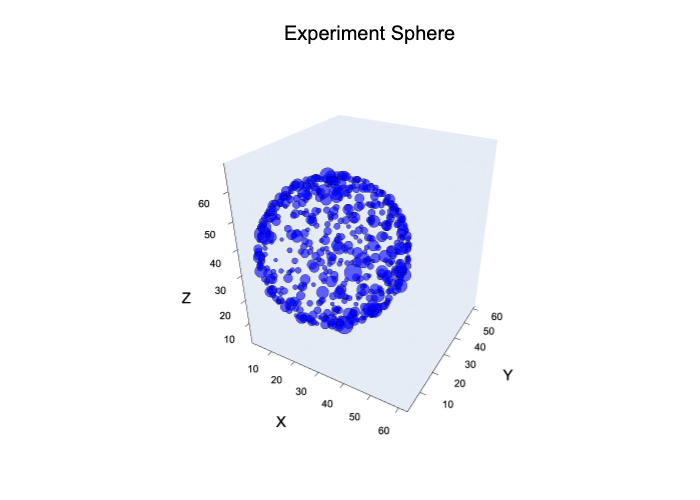

In [3]:
a = 12.0; b = 11.0; c = 18.0; r = 25.0;

# - Choose f(x,y,z) to define the surface
f(x,y,z) = (x-a)^2 + (y-b)^2 + (z-c)^2

ds = (ceil(Int,2*r+a), ceil(Int, 2*r+b), ceil(Int, 2*r+c));  # Enough space to center this sphere

# - Populate Δ near the surface defined near f  
𝕊 = ts(zeros(Float64, ds...)); # \bbS[TAB] gives 𝕊
for x in 1:ds[1], y in 1:ds[2], z in 1:ds[3]
    if abs( f(x-a,y-b,z-c) - r^2 ) < 2
        𝕊[x,y,z] = randn()
    end
end

plot_tensor(𝕊; title="Experiment Sphere", color=:blue)

We now use randomization to scramble the tensor, thereby hiding its embedded surface structure, and then pass the resulting array to Dleto:

In [4]:
𝕊_rn, Xs = randomize_tensor(𝕊)
@assert 𝕊 * Xs ≈ 𝕊_rn

𝕊_nd, Ys = nondeg(𝕊_rn)
@assert 𝕊_rn * Ys ≈ 𝕊_nd

𝕊_strat, Zs =stratify(𝕊_nd)
@assert 𝕊_nd * Zs ≈ 𝕊_strat


[ Info: Found 9 derivations for stratification.


┌ Warning: More than 1,000 viewable entries, plotting only the largest points.
└ @ DletoPlotsExt ~/CODE/OpenDleto/ext/DletoPlotsExt.jl:264


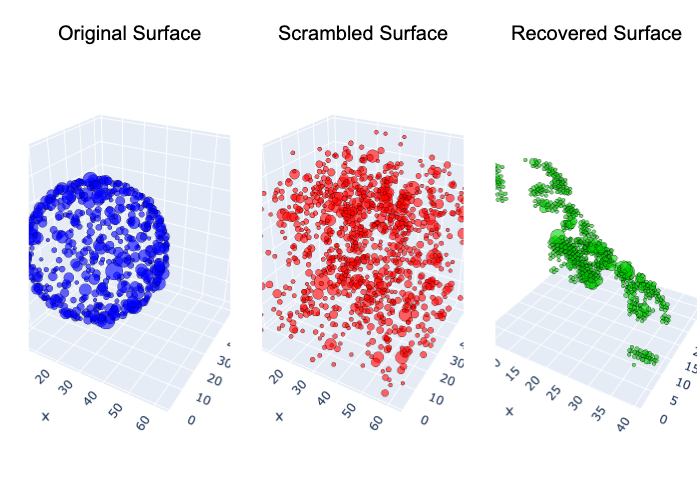

In [5]:

p1 = plot_tensor(𝕊; title="Original Surface", color=:blue)
p2 = plot_tensor(𝕊_rn; title="Scrambled Surface", color=:red)
p3 =plot_tensor(𝕊_strat; title="Recovered Surface", color=:green)
Plots.plot(p1, p2, p3; layout=(1,3), size=(900,400))

We invite you to repeat the scrambled surface construction with alternative parameter values. You should keep in mind, however, that tensor complexity is a function of the *product* of its dimensions, so we recommend making modest parameter increases as you acclimate to the effect on runtime.


## 3. Recovering the embedded surface

If you experimented with different parameter settings you will have observed that certain choices produce outcomes that are more like the original surface than others. You may also be somewhat surprised by *all* of the plots Dleto returned in the previous cell. This calls for some commentary on underlying theory before we proceed further.

One consequence of the theory is that points lying on the same cross-section of the original sphere produce the same real eigenvalues in that axis. Dleto orders points according to these eigenvalues so that points on the same level set are permuted together. In the case of our sphere, the effect is that the recovered sphere resembles an octant of the original sphere. 

Further variability arises from how points are sampled on the original surface.  There is a way to sample points on a surface that essentially restricts the output of Dleto to just the cross-sectional permutation described above. One can assign 
values $(u_x,v_y,w_z)$ to each point $(x,y,z)$ on the surface in such a way that $u_x+v_y+w_z\approx 0$ precisely when $(x,y,z)$ is near the target surface.  

We illustrate the idea using a sphere with equation 
$$r^2=(x-a)^2+(y-b)^2+(z-c)^2$$
We can discretize the sphere by selecting the values `u[i]`, `v[j]` and `w[k]` 
according to the following rule:
$$\begin{aligned}
u[i] & \approx (i-c)^2-r^2/3\\
v[j] & \approx (j-c)^2-r^2/3\\
w[k] & \approx (k-c)^2-r^2/3
\end{aligned}
$$
Using these values we see that
$$\begin{aligned}
0 & \approx u[i]+v[j]+w[k]\\
  & \approx \left((i-a)^2-\frac{r^2}{3}\right)+\left((j-b)^2-\frac{r^2}{3}\right)+\left((k-c)^2-\frac{r^2}{3}\right).
\end{aligned}
$$
It follows that
$$0\approx u[i]+v[j]+w[k]\quad \Rightarrow \quad (i-a)^2+(j-b)^2+(k-c)^2\approx r^2.$$
Thus, the values `u[i]`, `v[j]`, `w[k]` encode a discretized approximation of a sphere of radius $r$ and center $(a,b,c)$.

We refer to this as **sampling from the densor space**, and the command `randomSurfaceTensor` samples points in this manner:

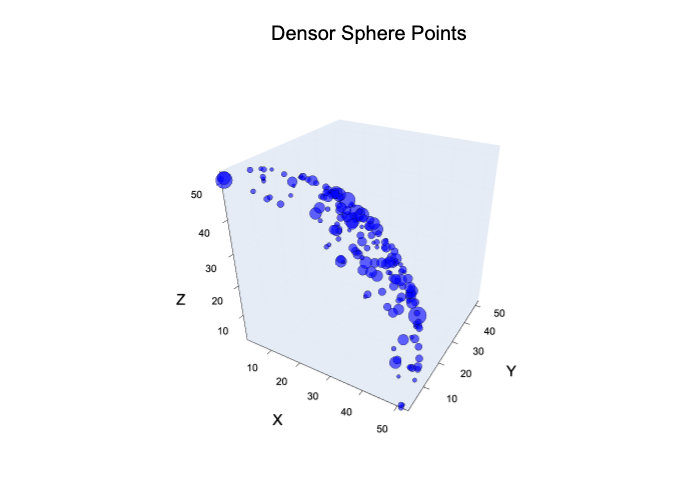

In [6]:
a = 0.0; b = 0.0; c = 0.0; r = 50.0;

Us = [(0:1:r+1)...] .|> i-> ((i-a)^2- (r^2)/3.0)
Vs = [(0:1:r+1)...] .|> j-> ((j-b)^2- (r^2)/3.0)
Ws = [(0:1:r+1)...] .|> k-> ((k-c)^2- (r^2)/3.0)

𝕊_den = randSurfaceTensor(Us, Vs, Ws, 1.5)
plot_tensor(𝕊_den; title="Densor Sphere Points", color=:blue)

Now we scramble our tensor sampled from the densor space and stratify it (after removing redundancy).

In [7]:
𝕊_den_rn, Xs = randomize_tensor(𝕊_den)
@assert 𝕊_den * Xs ≈ 𝕊_den_rn

𝕊_den_nd, Ys = nondeg(𝕊_den_rn)
@assert 𝕊_den_rn * Ys ≈ 𝕊_den_nd

𝕊_den_strat, Zs =stratify(𝕊_den_nd)
@assert 𝕊_den_nd * Zs ≈ 𝕊_den_strat


[ Info: Found 2 derivations for stratification.


Finally, we scramble our surface tensor and stratify.

┌ Warning: More than 1,000 viewable entries, plotting only the largest points.
└ @ DletoPlotsExt ~/CODE/OpenDleto/ext/DletoPlotsExt.jl:264


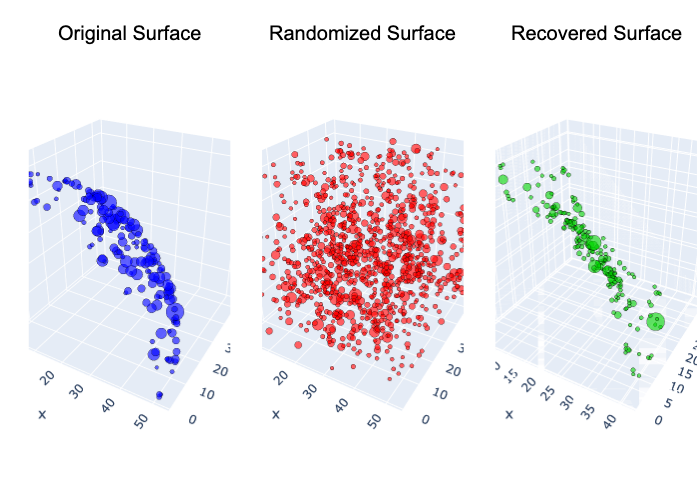

In [8]:
p1 = plot_tensor(𝕊_den; title="Original Surface", color=:blue)
p2 = plot_tensor(𝕊_den_rn; title="Randomized Surface", color=:red)
p3 =plot_tensor(𝕊_den_strat; title="Recovered Surface", color=:green)
Plots.plot(p1, p2, p3; layout=(1,3), size=(900,400))

Compare the outcome of this experiment with that of the first experiment. You may observe that the surface recovered in the second experiment more closely resembles the original than did the recovered surface in the first experiment. Per the discussion preceding the second experiment, this discrepancy is a consequence of the different ways in which the two original sphere tensors were sampled.

# Modified chisels

Many situations call for a chisel with restrictions such as symmetric or hermitian matrices.  The sphere lab is a good place to witness this implication.


In [9]:
a = 0.0; b = 0.0; c = 0.0; r = 50.0;

Us = [(0:1:r+1)...] .|> i -> ((i-a)^2 - (r^2)/3.0)
Vs = [(0:1:r+1)...] .|> j -> ((j-b)^2 - (r^2)/3.0)
Ws = [(0:1:r+1)...] .|> k -> ((k-c)^2 - (r^2)/3.0)

# Restrict the randomization to orthogonal transforms.
𝕊_den_rn, Xs = randomize_tensor(𝕊_den; type=:orthogonal)
@assert 𝕊_den * Xs ≈ 𝕊_den_rn
@assert Dleto.is_orthogonal(Xs)

p1 = plot_tensor(𝕊_den; title="Original Surface", color=:blue)
p2 = plot_tensor(𝕊_den_rn; title="Orthogonally Randomized Surface", color=:red)
Plots.plot(p1, p2; layout=(1,2), size=(900,400))


LoadError: In `permute(::ITensor, inds...)`, the input ITensor has indices: 

((dim=52|id=506|"a1"), (dim=52|id=506|"Randomized,a1"))

but the desired Index ordering is: 

()

  Julia 1.12 has introduced more strict world age semantics for global bindings.
  !!! This code may malfunction under Revise.
  !!! This code will error in future versions of Julia.
Hint: Add an appropriate `invokelatest` around the access to this binding.
To make this warning an error, and hence obtain a stack trace, use `julia --depwarn=error`.


Now when we stratify we will restrict our attention to symmetric operators.

In [ ]:
Ωsym = SymmetricOps(𝕊_den_rn)
P = UniversalChisel(valence(Ωsym))

𝕊_den_sym, Xsym = stratify(Ωsym, P, 𝕊_den_rn; method=:Auto)
@assert 𝕊_den_rn * Xsym ≈ 𝕊_den_sym


p1 = plot_tensor(𝕊_den; title="Original Surface", color=:blue)
p2 = plot_tensor(𝕊_den_rn; title="Randomized Surface", color=:red)
p3 = plot_tensor(𝕊_den_sym; title="Stratified (Symmetric Operators)", color=:green)
Plots.plot(p1, p2, p3; layout=(1,3), size=(900,400))